In [22]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pickle
import matplotlib
import os
import sys

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sys.path.append(os.path.abspath('') + '/../..')

In [23]:
def clean(net_description):

    net_description = net_description.split(']')
    net_description.pop(-1)
    net_description.pop(-1)
    net_description[0] = net_description[0][2:]

    for i in range( 1, len(net_description) ):
        net_description[i] = net_description[i][3:]

    for i in range( len(net_description) ):

        net_description[i] = net_description[i].split(', (')

        for j in range( 1, len(net_description[i]) ):
            net_description[i][j] = '(' + net_description[i][j]

        for j in range( len(net_description[i]) ):
            net_description[i][j] = net_description[i][j].split('->')
            net_description[i][j][0] = eval(net_description[i][j][0])
            net_description[i][j][1] = int(net_description[i][j][1])
            net_description[i][j][2] = eval(net_description[i][j][2])

    return net_description

def find_layer(node_nb, net_description):

    for i, layer_description in enumerate(net_description):
        for node_description in layer_description:
            if node_nb == node_description[1]:
                return i

def find_largest_layer_size(net_description):
    
    largest_layer_size = 0

    for i in range( len(net_description) ):
        if len(net_description[i]) > largest_layer_size:
            largest_layer_size = len(net_description[i])

    return largest_layer_size

def plot(path, plot_size, node_size, r_node_size):

    with open(path, 'rb') as f:
        net_description = clean( pickle.load(f) )

    G = nx.DiGraph()
    color_map = []

    nb_layers = len(net_description)
    input_layer_description = net_description[0]
    nb_input_nodes = len(input_layer_description)
    output_layer_description = net_description[-1]
    nb_output_nodes = len(output_layer_description)
    nb_hidden_layers = nb_layers - 2
    nb_parameters = 0

    largest_layer_size = find_largest_layer_size(net_description)

    input_layer_ys = [(largest_layer_size+1)/(nb_input_nodes+1)*n for n in range(nb_input_nodes+2)]
    input_layer_ys.pop(0)
    input_layer_ys.pop(-1)
    input_layer_ys.reverse()

    for j, input_node_description in enumerate(input_layer_description):
        G.add_node( input_node_description[1], pos=(0, input_layer_ys[j]) )
        color_map.append('moccasin')

    for i in range(nb_hidden_layers):

        layer_ys = [(largest_layer_size+1)/( len(net_description[i+1]) +1)*n for n in range( len(net_description[i+1]) + 2 )]
        layer_ys.pop(0)
        layer_ys.pop(-1)
        layer_ys.reverse()

        for j, hidden_node_description in enumerate(net_description[i+1]):
            G.add_node( hidden_node_description[1], pos=(i+1, layer_ys[j]) )
            color_map.append('#adcda2ff')
            nb_parameters += 1

    output_layer_ys = [(largest_layer_size+1)/(nb_output_nodes+1)*n for n in range(nb_output_nodes+2)]
    output_layer_ys.pop(0)
    output_layer_ys.pop(-1)
    output_layer_ys.reverse()

    for j, output_node_description in enumerate(output_layer_description):
        G.add_node( output_node_description[1], pos=(nb_layers-1, output_layer_ys[j] ))
        color_map.append('#faa6a6ff')
        nb_parameters += 1

    loop_recurrent_edge_list = []
    recurrent_edge_list = []

    for layer_description in net_description:
        for node_description in layer_description:
            _, node_nb, out_node_nbs = node_description
            for out_node_nb in out_node_nbs:
                if isinstance(out_node_nb, int):
                    if out_node_nb != node_nb:
                        layer_difference = find_layer(out_node_nb, net_description) - find_layer(node_nb, net_description)
                        if layer_difference >= 1:
                            G.add_edge(node_nb, out_node_nb)
                        else:
                            recurrent_edge_list.append((node_nb, out_node_nb))
                    else:
                        loop_recurrent_edge_list.append((node_nb, node_nb))
                    nb_parameters += 1

    plt.rcParams["figure.figsize"] = [plot_size, plot_size]
    plt.xlim([-1, nb_layers])
    plt.ylim([0, largest_layer_size+1])
    nx.draw(G, nx.get_node_attributes(G,'pos'), node_color=color_map, with_labels=True, arrowsize=10, node_size=node_size, width=1.2, edge_color="dimgray")
    ax = plt.gca()
    ax.collections[0].set_edgecolor("dimgray")

    for edge in recurrent_edge_list:
        G.add_edges_from([edge])
        nx.draw_networkx_edges(G, nx.get_node_attributes(G,'pos'), style='--', node_size=node_size, edgelist=[edge], width=1.2, edge_color='fuchsia')

    for edge in loop_recurrent_edge_list:
        G.add_edges_from([edge])
        nx.draw_networkx_edges(G, nx.get_node_attributes(G,'pos'), style='--', arrowstyle="<|-", node_size=r_node_size, edgelist=[edge], width=1.2, edge_color='fuchsia')

    print(str(nb_parameters) + ' parameters')

    plt.savefig(path[:-3] + 'png', dpi=200)

# Acrobot-v1

71 parameters


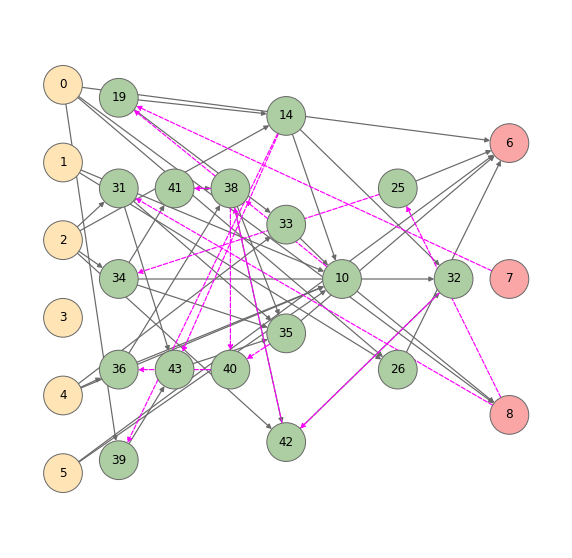

In [24]:
path = '../../data/states/envs.control.score/task.acrobot~trials.1/bots.dynamic.rnn.control/16/100/net.pkl'
plot(path, plot_size=10, node_size=1500, r_node_size=1500)

# CartPole-v1

9 parameters


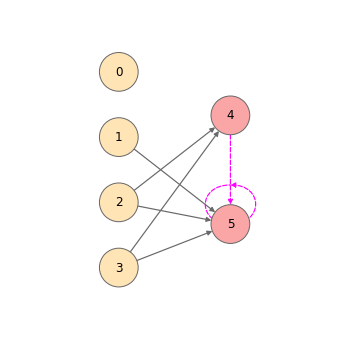

In [25]:
path = '../../data/states/envs.control.score/task.cart_pole~trials.1/bots.dynamic.rnn.control/16/100/net.pkl'
plot(path, plot_size=6, node_size=1500, r_node_size=1200)

# MountainCar-v0

96 parameters


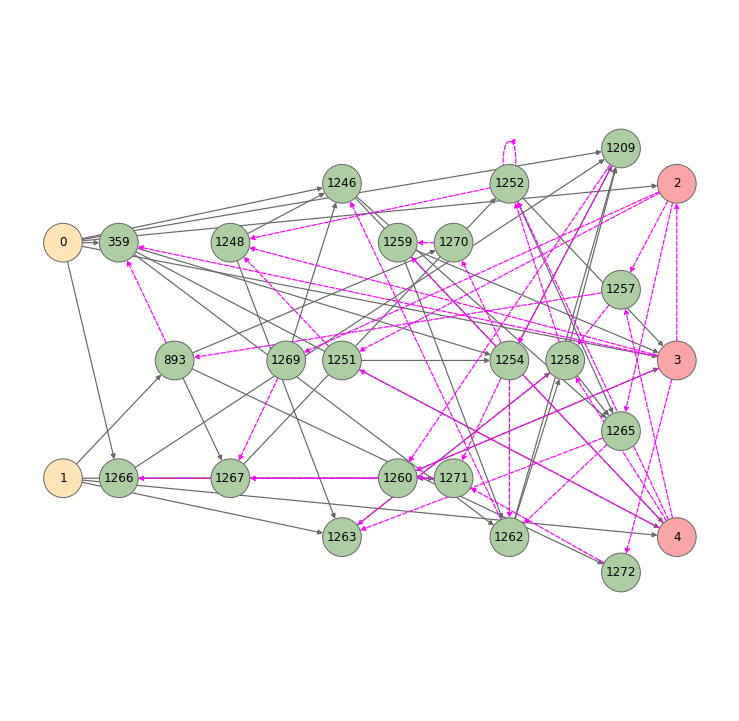

In [26]:
path = '../../data/states/envs.control.score/task.mountain_car~trials.1/bots.dynamic.rnn.control/32/4000/net.pkl'
plot(path, plot_size=13, node_size=1500, r_node_size=600)

# MountainCarContinuous-v0

3 parameters


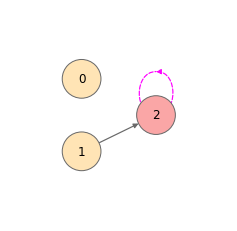

In [27]:
path = '../../data/states/envs.control.score/task.mountain_car_continuous~trials.1/bots.dynamic.rnn.control/32/500/net.pkl'
plot(path, plot_size=4, node_size=1500, r_node_size=1200)

# Pendulum-v1

322 parameters


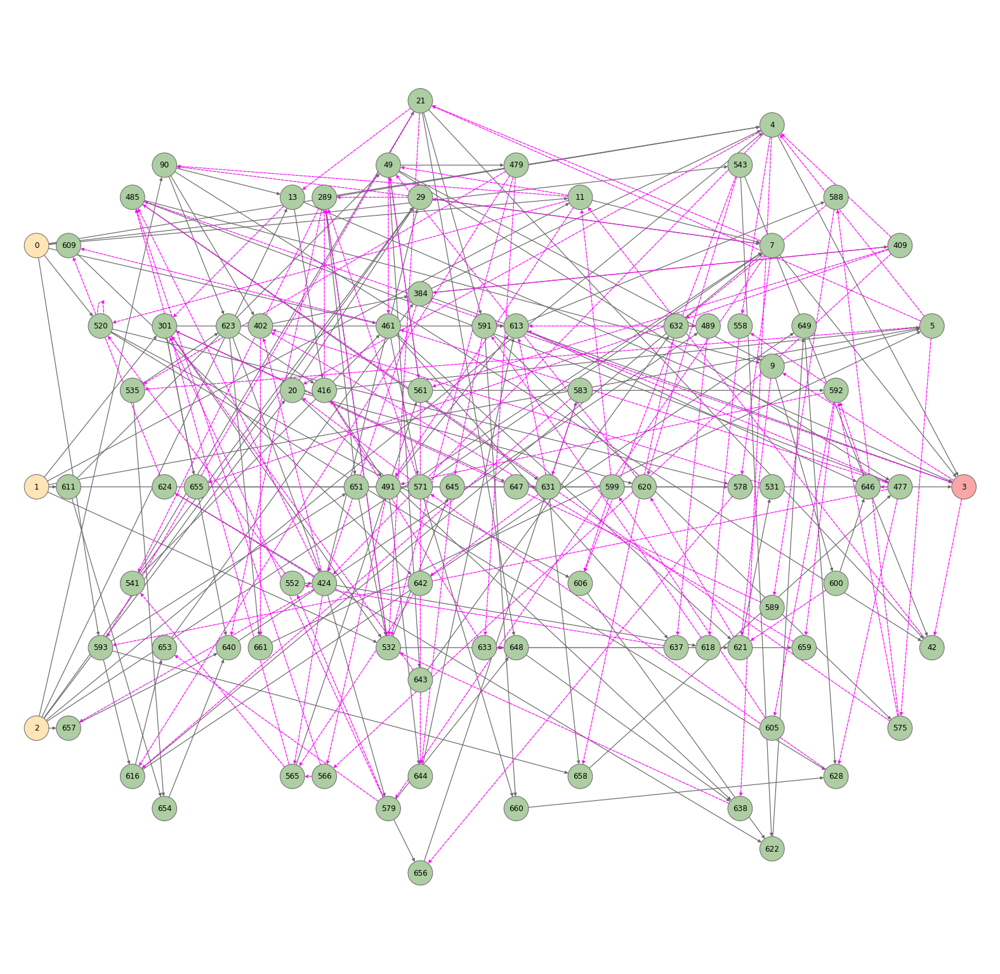

In [28]:
path = '../../data/states/envs.control.score/task.pendulum~trials.5/bots.dynamic.rnn.control/256/2000/net.pkl'
plot(path, plot_size=28, node_size=1500, r_node_size=500)

# BipedalWalker-v3

144 parameters


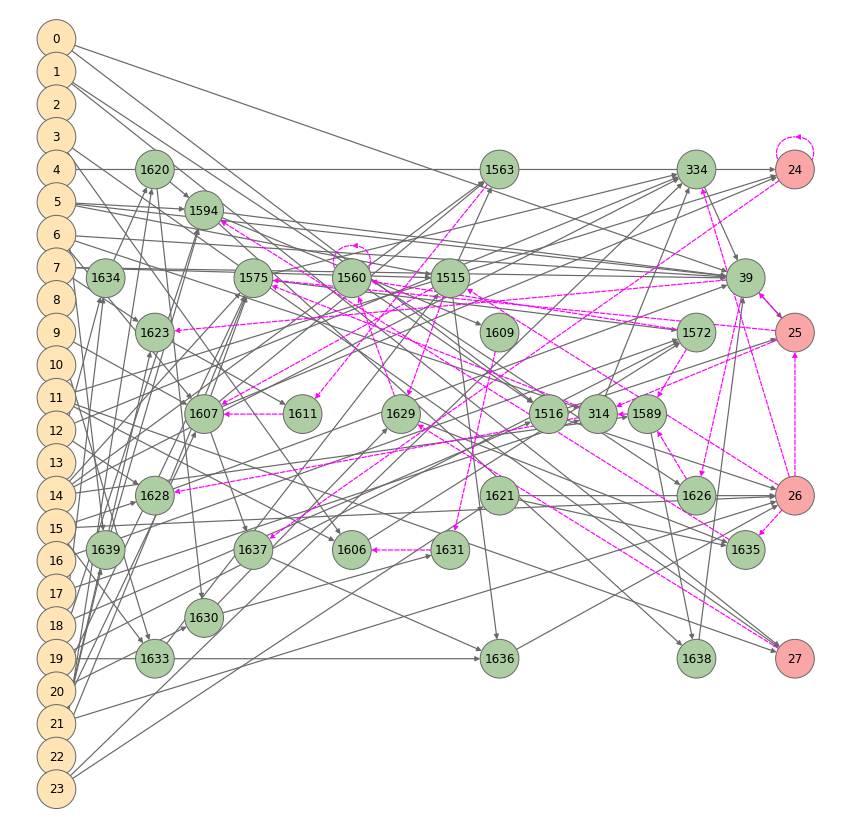

In [29]:
path = '../../data/states/envs.control.score/task.bipedal_walker~trials.1/bots.dynamic.rnn.control/64/5000/net.pkl'
plot(path,  plot_size=15, node_size=1500, r_node_size=2000)

# BipedalWalkerHardcore-v3

145 parameters


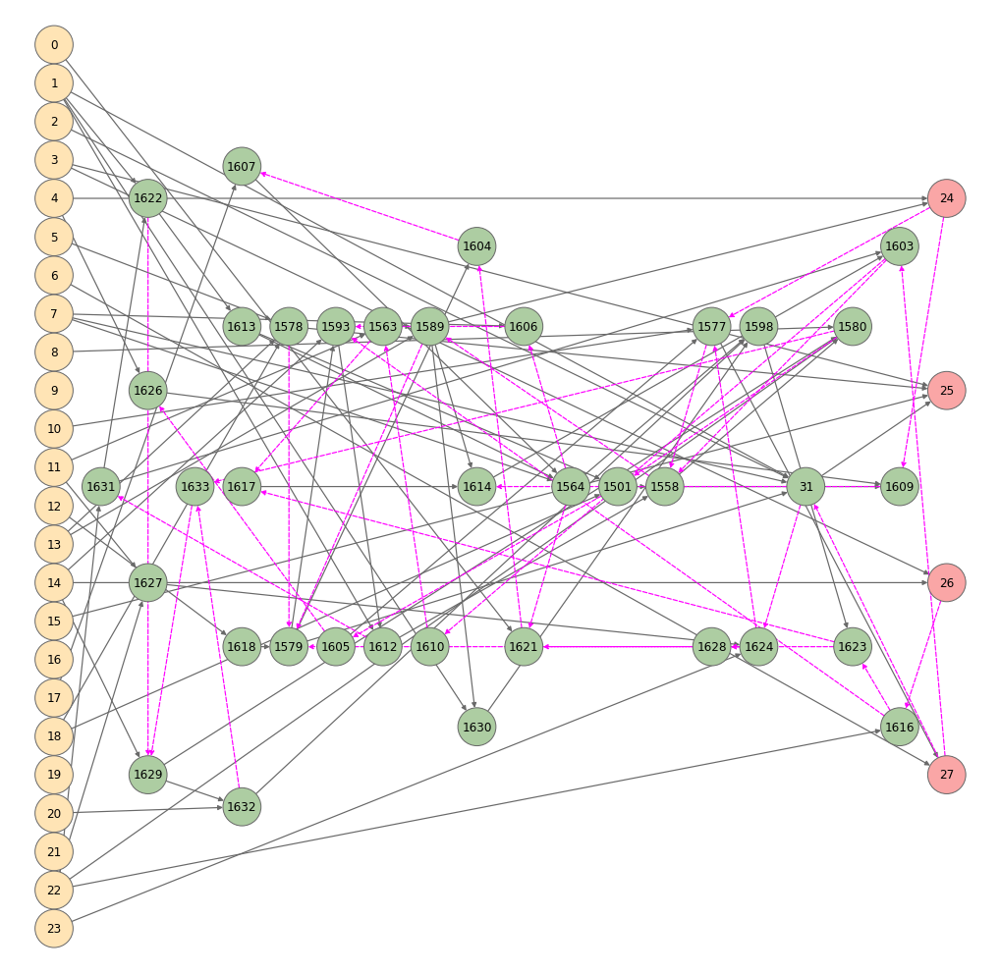

In [30]:
path = '../../data/states/envs.control.score/task.bipedal_walker_hardcore~trials.1/bots.dynamic.rnn.control/128/5000/net.pkl'
plot(path,  plot_size=18, node_size=1500, r_node_size=2000)

# LunarLander-v2

128 parameters


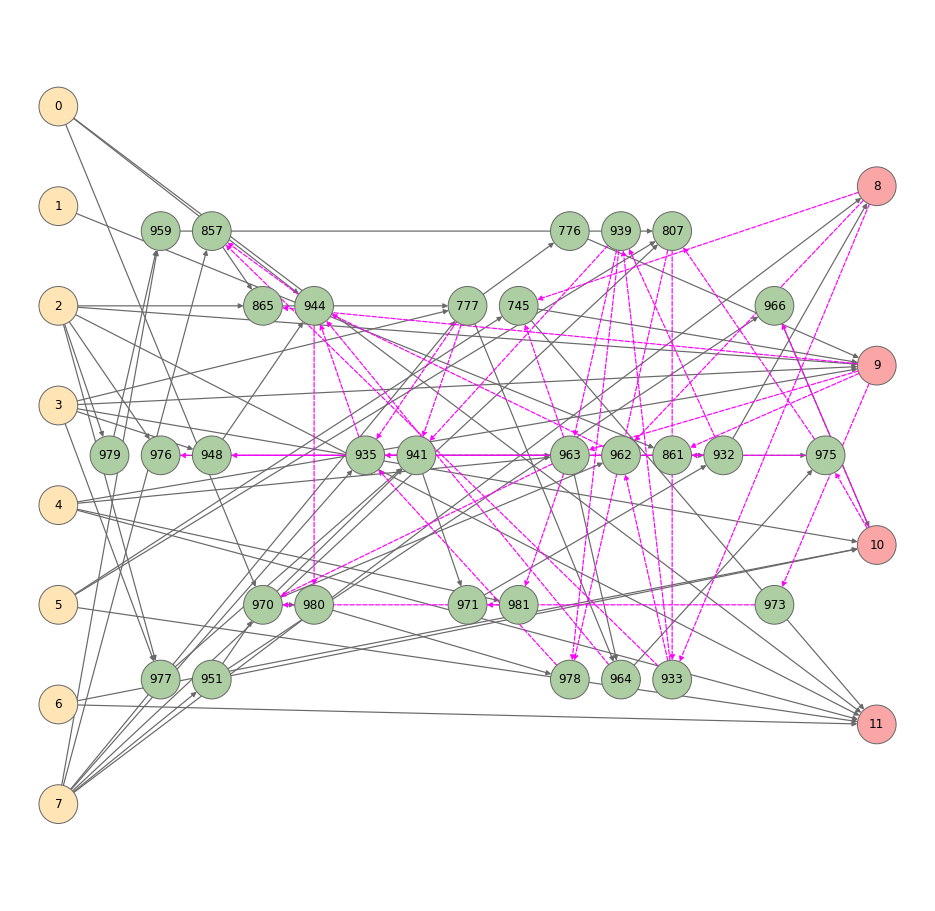

In [31]:
path = '../../data/states/envs.control.score/task.lunar_lander~trials.1/bots.dynamic.rnn.control/64/3000/net.pkl'
plot(path, plot_size=16.5, node_size=1500, r_node_size=2000)

# LunarLanderContinuous-v2

93 parameters


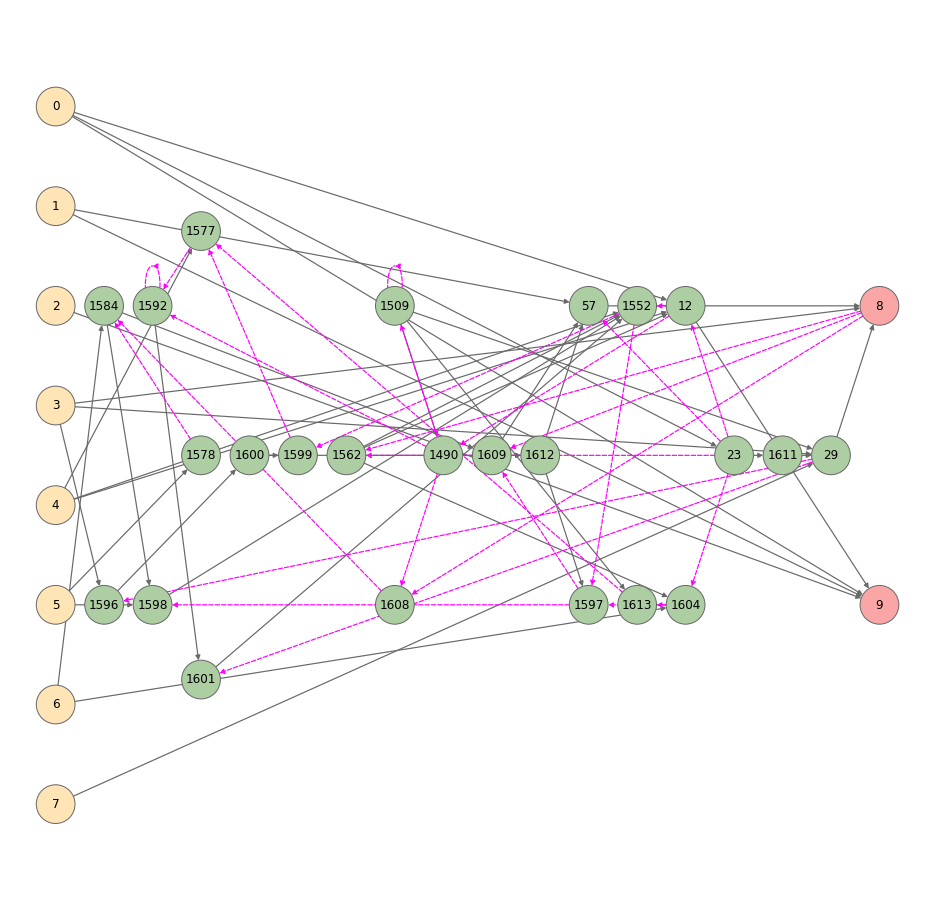

In [32]:
path = '../../data/states/envs.control.score/task.lunar_lander_continuous~trials.1/bots.dynamic.rnn.control/64/5000/net.pkl'
plot(path, plot_size=16.5, node_size=1500, r_node_size=800)

# Ant-v3

265 parameters


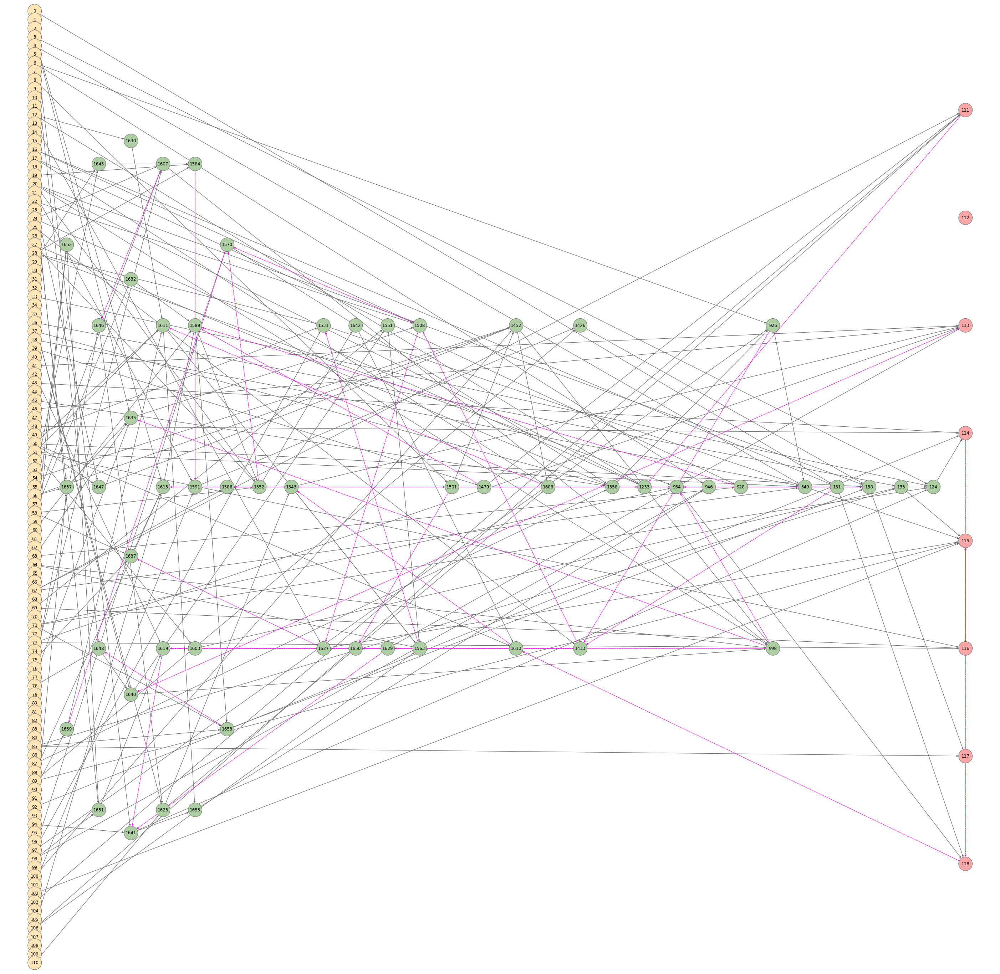

In [33]:
path = '../../data/states/envs.control.score/task.ant~trials.1/bots.dynamic.rnn.control/512/5000/net.pkl'
plot(path, plot_size=50, node_size=1500, r_node_size=5000)

# HalfCheetah-v3

75 parameters


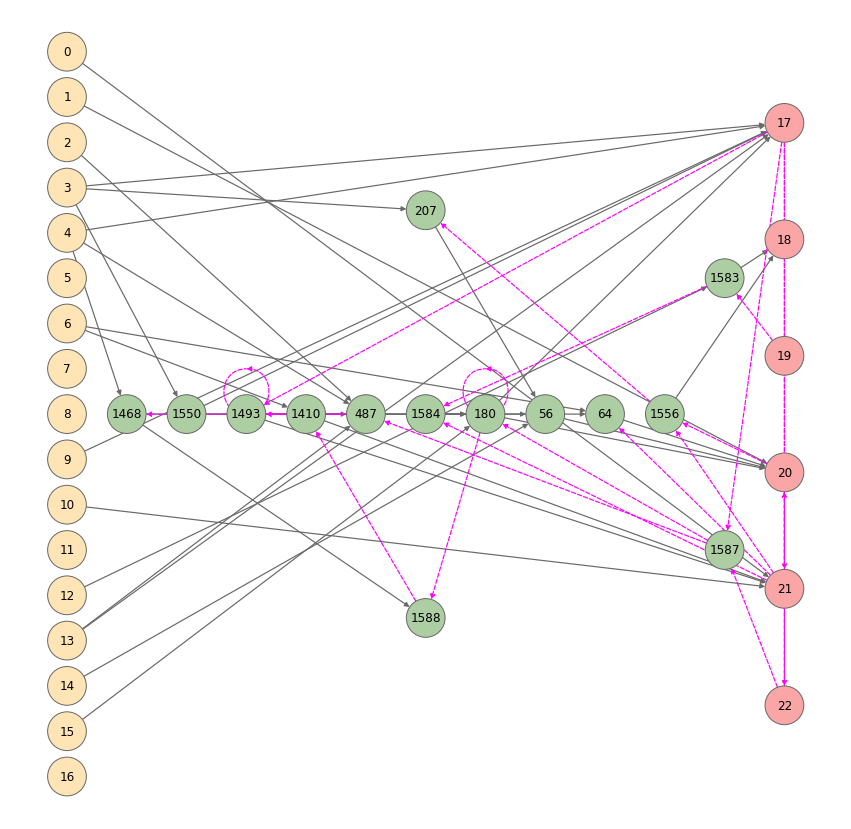

In [34]:
path = '../../data/states/envs.control.score/task.half_cheetah~trials.1/bots.dynamic.rnn.control/256/5000/net.pkl'
plot(path, plot_size=15, node_size=1500, r_node_size=2000)

# Hopper-v3

147 parameters


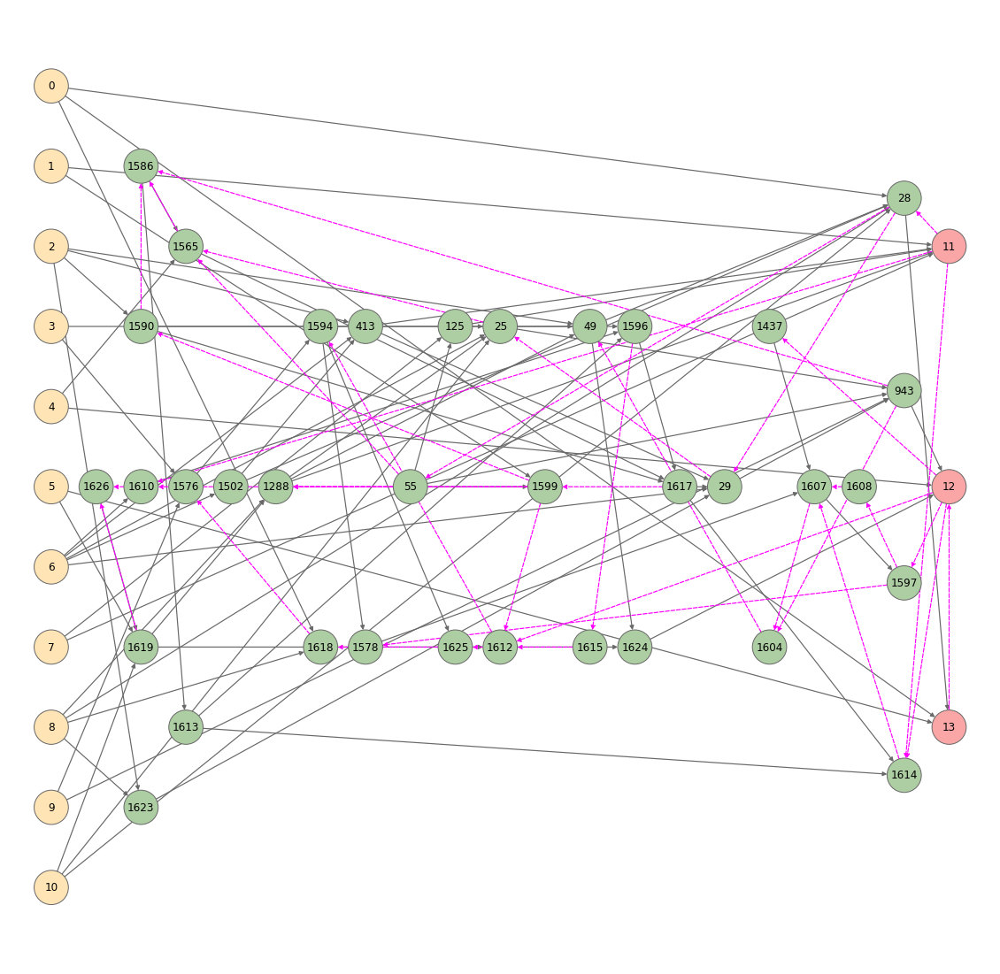

In [35]:
path = '../../data/states/envs.control.score/task.hopper~trials.1/bots.dynamic.rnn.control/256/5000/net.pkl'
plot(path, plot_size=20, node_size=1500, r_node_size=2000)

# Humanoid-v3

242 parameters


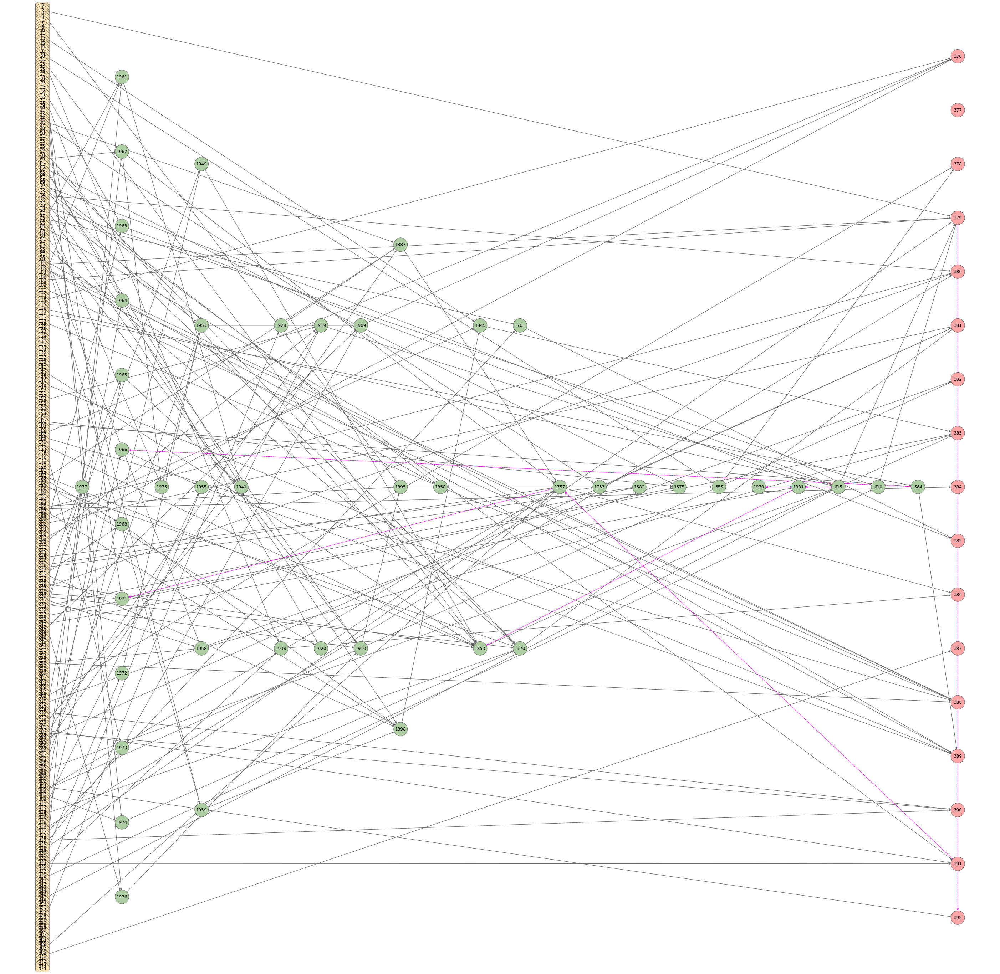

In [36]:
path = '../../data/states/envs.control.score/task.humanoid~trials.1/bots.dynamic.rnn.control/512/5000/net.pkl'
plot(path, plot_size=50, node_size=1500, r_node_size=2000)

# HumanoidStandup-v2

186 parameters


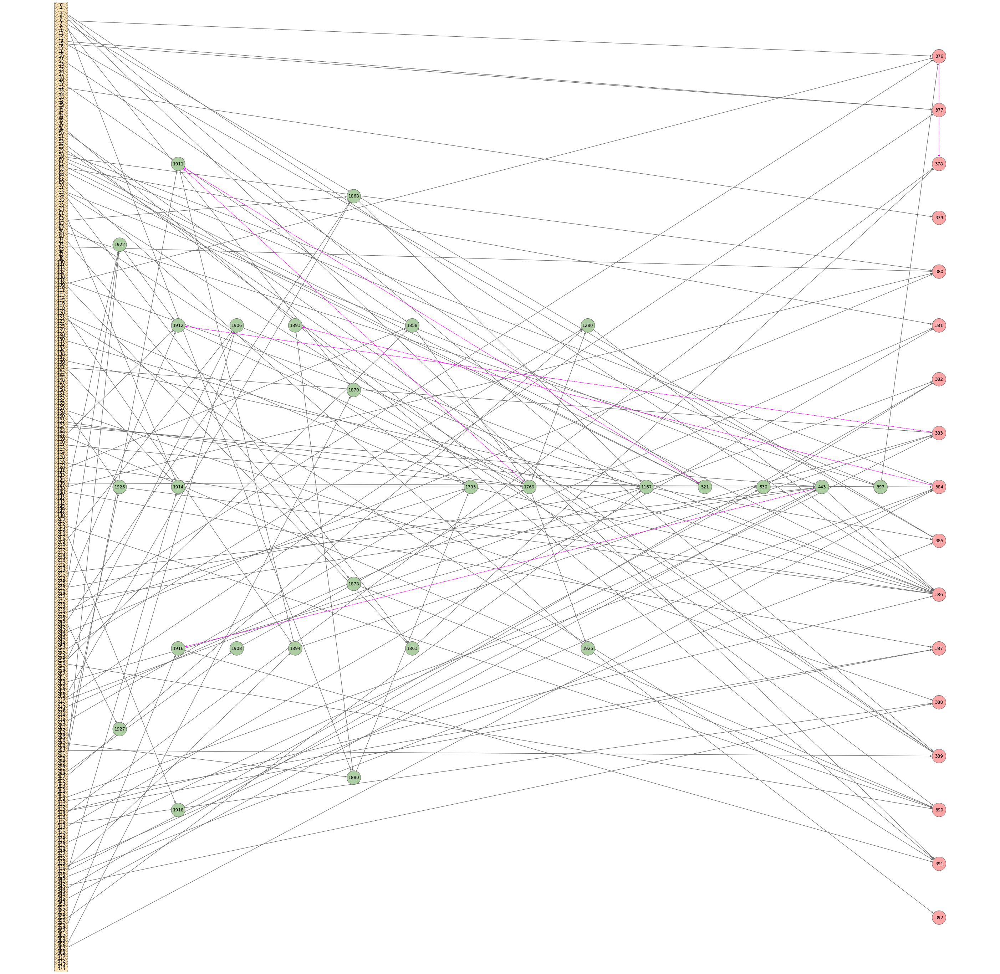

In [37]:
path = '../../data/states/envs.control.score/task.humanoid_standup~trials.1/bots.dynamic.rnn.control/256/5000/net.pkl'
plot(path, plot_size=50, node_size=1500, r_node_size=2000)

# InvertedDoublePendulum-v2

87 parameters


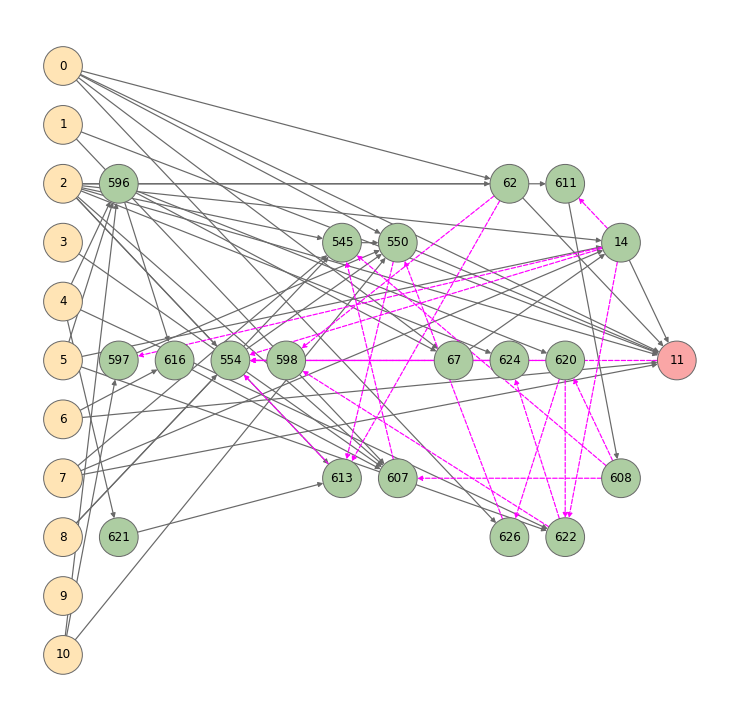

In [38]:
path = '../../data/states/envs.control.score/task.inverted_double_pendulum~trials.1/bots.dynamic.rnn.control/32/2000/net.pkl'
plot(path, plot_size=13, node_size=1500, r_node_size=2000)

# InvertedPendulum-v2

52 parameters


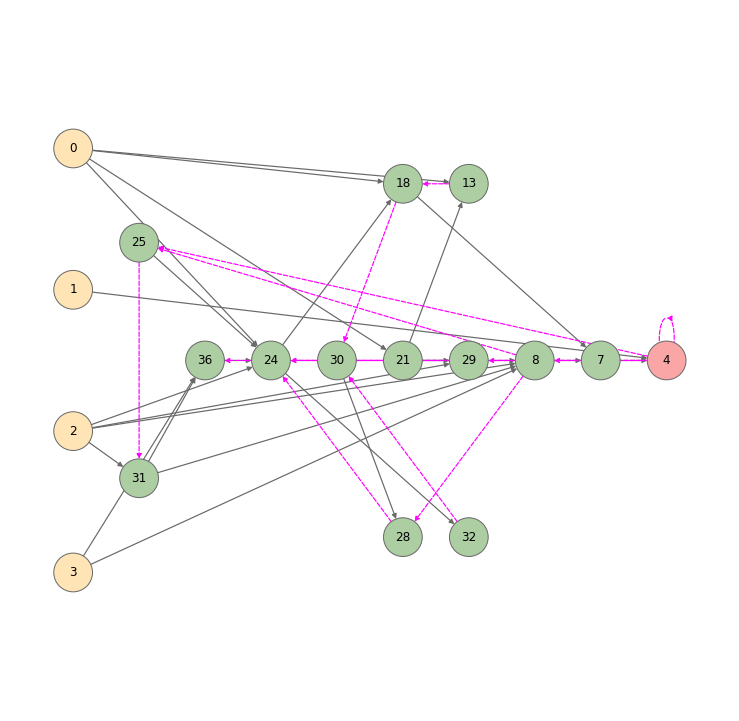

In [39]:
path = '../../data/states/envs.control.score/task.inverted_pendulum~trials.1/bots.dynamic.rnn.control/16/100/net.pkl'
plot(path, plot_size=13, node_size=1500, r_node_size=600)

# Reacher-v2

75 parameters


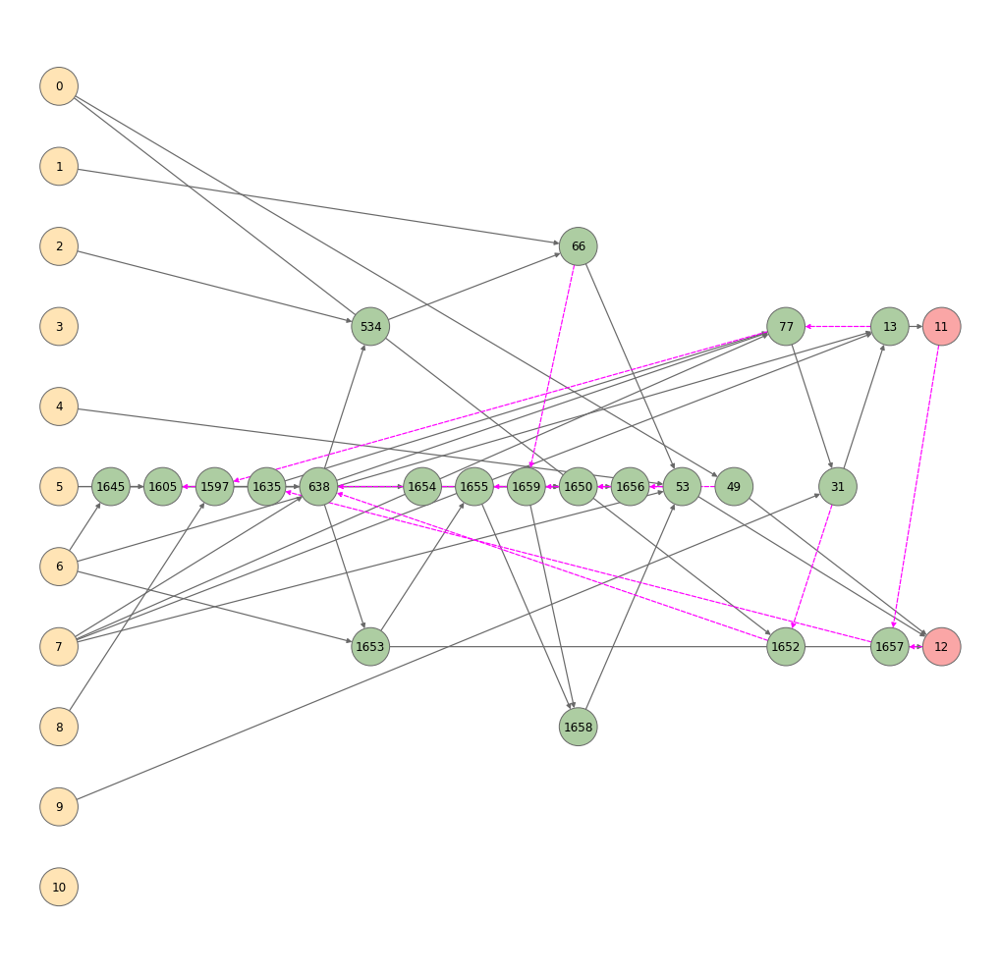

In [40]:
path = '../../data/states/envs.control.score/task.reacher~trials.5/bots.dynamic.rnn.control/128/5000/net.pkl'
plot(path, plot_size=18, node_size=1500, r_node_size=2000)

# Swimmer-v3

105 parameters


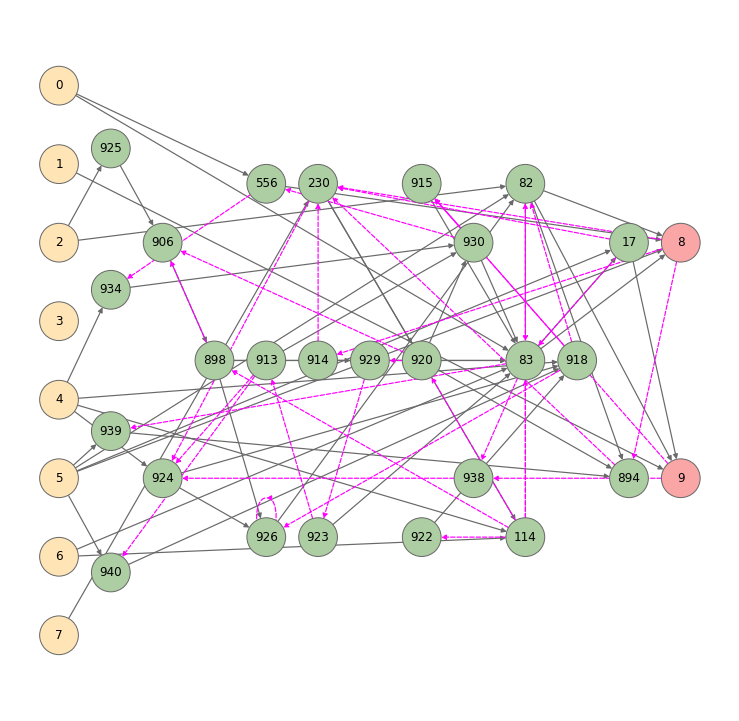

In [41]:
path = '../../data/states/envs.control.score/task.swimmer~trials.1/bots.dynamic.rnn.control/16/3000/net.pkl'
plot(path, plot_size=13, node_size=1500, r_node_size=1000)

# Walker2d-v3

176 parameters


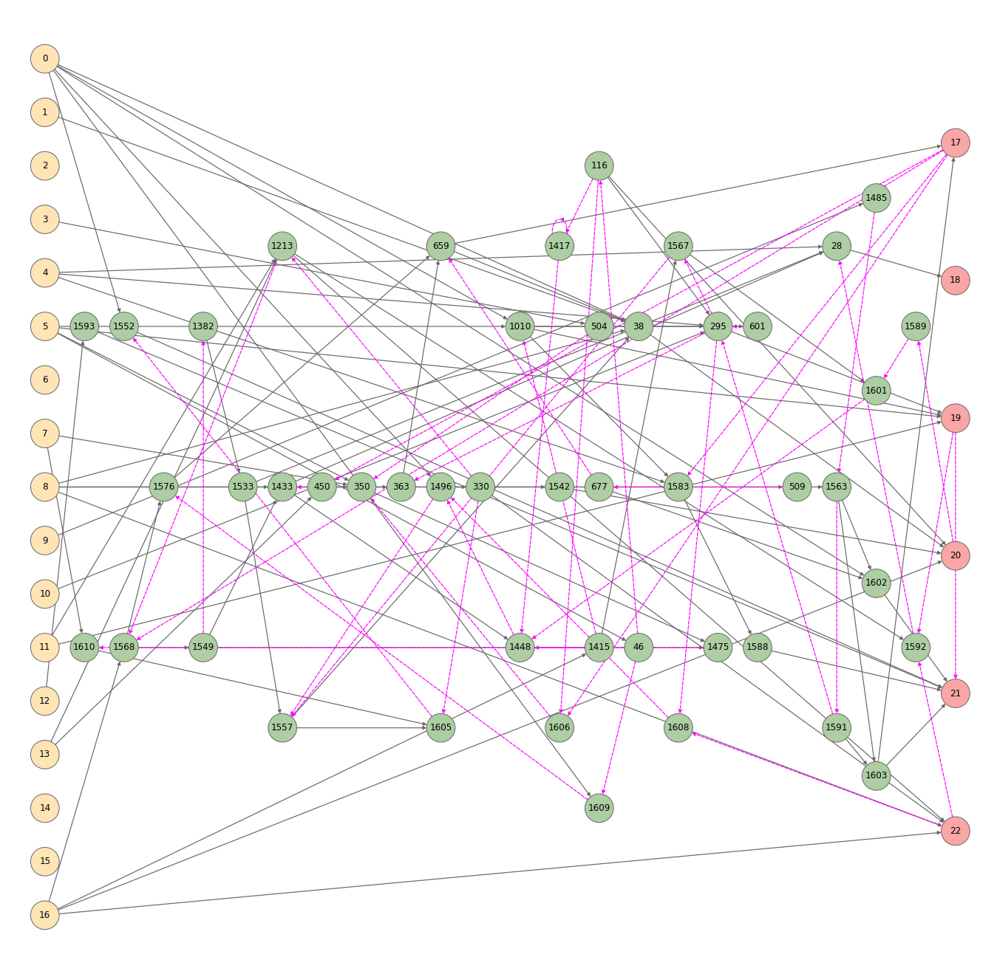

In [42]:
path = '../../data/states/envs.control.score/task.walker_2d~trials.1/bots.dynamic.rnn.control/256/5000/net.pkl'
plot(path, plot_size=24, node_size=1500, r_node_size=1000)